In [0]:
%pip install tzwhere
%pip install geopandas
%pip install holidays
%pip install pyvis

Python interpreter will be restarted.
  Created wheel for tzwhere: filename=tzwhere-3.0.3-py3-none-any.whl size=23742600 sha256=692318afe9fd4bd9bd02378ae8143826a6ec23a54f7bde2f4f03841f75f5c552
  Stored in directory: /home/spark-a4850bee-cb05-48f7-98be-d4/.cache/pip/wheels/1c/5b/38/2c0772ba05aa51fefb242a15ed85fb649990712901b6c80458
Successfully built tzwhere
Python interpreter will be restarted.
Python interpreter will be restarted.
Python interpreter will be restarted.
Python interpreter will be restarted.
Python interpreter will be restarted.
Python interpreter will be restarted.
  Created wheel for pyvis: filename=pyvis-0.3.1-py3-none-any.whl size=755850 sha256=a1a9fcdb81e142607662e9e725dc94f71db27be214b58b65807a9e6e531014f3
  Stored in directory: /home/spark-a4850bee-cb05-48f7-98be-d4/.cache/pip/wheels/55/7b/4b/dc896cf96ad07e0dc92d30e1984ab583c0d0feec208756e2b2
Successfully built pyvis
Python interpreter will be restarted.


In [0]:
import pyspark.sql.functions as F
from pyspark.sql import *
from pyspark.sql.types import IntegerType, StringType
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.stat import Correlation
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import datetime as dt
import holidays
from pyvis import network as net

BACKGROUND = "black"
FOREGROUND = "#73F9CB"

# Feature Engineering 


### Load the Instructor Provided joined Data Set

For phase 3 we chose to use the instructor provided data set which pre-joins the flights and weather data. This allows us to focus more on the feature engineering, model development, and hyper-parameter tuning aspects of the project. The pre-joined data set contains 422,271,633 rows and 168 columns.

In [0]:
import os

---------------------------------------------------------------------------
FileNotFoundError                         Traceback (most recent call last)
<command-4218126530937422> in <cell line: 2>()
      1 import os
----> 2 os.listdir('dbfs/FileStore')

FileNotFoundError: [Errno 2] No such file or directory: 'dbfs/FileStore'

In [0]:
data_BASE_DIR = "dbfs:/mnt/mids-w261-joined/"
data = spark.read.parquet(f"{data_BASE_DIR}")
display(data)
# dbutils.data.summarize(data)
print(f"Data size: {data.count()} rows and {len(data.columns)}")

_utc_dept_ts,_utc_dept_minus2_ts,_utc_dept_actual_ts,_utc_arr_ts,_utc_arr_actual_ts,_dep_time_str,_local_dept_ts,_local_dept_minus2_ts,_local_dept_actual_ts,_local_at_src_airport_arr_ts,_local_at_src_airport_arr_actual_ts,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,origin_airport_iata,origin_airport_tz,origin_airport_type,origin_airport_elevation,origin_airport_iso_country,origin_airport_iso_region,origin_airport_ws_station_id,dest_airport_iata,dest_airport_tz,dest_airport_type,dest_airport_elevation,dest_airport_iso_country,dest_airport_iso_region,dest_airport_ws_station_id,origin_weather_Station,origin_weather_Datehour,origin_weather_Avg_Elevation,origin_weather_Avg_HourlyAltimeterSetting,origin_weather_Avg_HourlyDewPointTemperature,origin_weather_Avg_HourlyDryBulbTemperature,origin_weather_Avg_HourlyPressureChange,origin_weather_Avg_HourlyRelativeHumidity,origin_weather_Avg_HourlySeaLevelPressure,origin_weather_Avg_HourlyStationPressure,origin_weather_Avg_HourlyVisibility,origin_weather_Avg_HourlyWetBulbTemperature,origin_weather_Avg_HourlyWindDirection,origin_weather_Avg_HourlyWindGustSpeed,origin_weather_Avg_HourlyWindSpeed,origin_weather_Avg_Precip_Double,origin_weather_Trace_Rain,origin_weather_NonZero_Rain,origin_weather_HourlyPressureTendency_Increasing,origin_weather_HourlyPressureTendency_Decreasing,origin_weather_HourlyPressureTendency_Constant,origin_weather_Calm_Winds,origin_weather_Sky_Conditions_CLR,origin_weather_Sky_Conditions_FEW,origin_weather_Sky_Conditions_SCT,origin_weather_Sky_Conditions_BKN,origin_weather_Sky_Conditions_OVC,origin_weather_Sky_Conditions_VV,origin_weather_Present_Weather_Drizzle,origin_weather_Present_Weather_Rain,origin_weather_Present_Weather_Snow,origin_weather_Present_Weather_SnowGrains,origin_weather_Present_Weather_IceCrystals,origin_weather_Present_Weather_Hail,origin_weather_Present_Weather_Mist,origin_weather_Present_Weather_Fog,origin_weather_Present_Weather_Smoke,origin_weather_Present_Weather_Dust,origin_weather_Present_Weather_Haze,origin_weather_Present_Weather_Storm,dest_weather_Station,dest_weather_Datehour,dest_weather_Avg_Elevation,dest_weather_Avg_HourlyAltimeterSetting,dest_weather_Avg_HourlyDewPointTemperature,dest_weather_Avg_HourlyDryBulbTemperature,dest_weather_Avg_HourlyPressureChange,dest_weather_Avg_HourlyRelativeHumidity,dest_weather_Avg_HourlySeaLevelPressure,dest_weather_Avg_HourlyStationPressure,dest_weather_Avg_HourlyVisibility,dest_weather_Avg_HourlyWetBulbTemperature,dest_weather_Avg_HourlyWindDirection,dest_weather_Avg_HourlyWindGustSpeed,dest_weather_Avg_HourlyWindSpeed,dest_weather_Avg_Precip_Double,dest_weather_Trace_Rain,dest_weather_NonZero_Rain,dest_weather_HourlyPressureTendency_Increasing,dest_weather_HourlyPressureTendency_Decreasing,dest_weather_HourlyPressureTendency_Constant,dest_weather_Calm_Winds,dest_weather_Sky_Conditions_CLR,dest_weather_Sky_Conditions_FEW,dest_weather_Sky_Conditions_SCT,dest_weather_Sky_Conditions_BKN,dest_weather_Sky_Conditions_OVC,dest_weather_Sky_Conditions_VV,dest_weather_Present_Weather_Drizzle,dest_weather_Present_Weather_Rain,dest_weather_Present_Weather_Snow,dest_weather_Present_Weather_SnowGrains,dest_weather_Present_Wea

Data size: 42271633 rows and 169


### 1. Aiport Page Rank

Each of the airports in the flights data set could be considered a node in a directed graph where each flight is an edge directed from the origin to destination airport. The length of each edge could be considrered equivalent to the flight distance. In the flight analogy the random surfer becomes a random traveler who rolls a dice at each airport selecting randomly one of the departing possible flights, and then occasionally teleports to a different origin airport rather thank taking one at all. The teleportation factor may not be necessary in this case because airports are unlikely to be 'hanging nodes' with only flights coming in and no flights going out. 

**Create Flights Adjacency List**

Before performing Page Rank we need to establish the connectivty of the airports through an adjacency matrix or list. Based on a comparison of the unique origin and destination airports there are no 'dangling' nodes in the network. Dangling nodes are nodes with only in edges and no out edges which could result in an ineffective page-rank implementation due to accumulation of mass in the dangling nodes.

In [0]:
# Create a dataframe that represents and adjacency list of the airports connections and initialize the rank of all graphs to 1/N where N is the number of nodes.
from pyspark.sql.functions import *
from pyspark.sql.window import Window

# Confirm that every destination is also an origin so there are no dangling nodes.
w = Window().orderBy(lit("A"))
origins = data.select(col("origin").alias("node")).distinct()
print(f"Unique origins: {origins.count()}.")
destinations = data.select(col("dest").alias("node")).distinct()
print(f"Unique destinations: {destinations.count()}")

data = data.where(year(col("fl_date")) == "2021")

# Create a column to unique-ify the flights to allow easier counting of them
flights = (
    data.withColumn("unique_flight", concat(col("tail_num"), col("crs_dep_time")))
    .select("*")
    .select("origin", "dest", "unique_flight")
)
# Filter to just 2022 for the visualization


# Count unique flights grouped by airport pairs to define the edges of the graph and from this we can also get the total number of nodes.
edges = flights.groupBy("origin", "dest").count().orderBy("origin", col("count").desc())
total_nodes = data.select(col("origin").alias("node")).distinct().count()


def get_node_adjacency(destinations, flight_counts):
    """Return a dictionary where keys are destinations and values are # of unique flights from the corresponding origin to that destination"""
    adjacency_dict = dict(zip(destinations, flight_counts))
    return str(adjacency_dict)


adjacency_func = udf(get_node_adjacency, StringType())
adj = (
    edges.groupBy("origin")
    .agg(collect_list("count").alias("count"), collect_list("dest").alias("dest"))
    .select("origin", "count", "dest")
)
adj = adj.withColumn("adjacencies", adjacency_func(col("dest"), col("count"))).select(
    "origin", "adjacencies"
)
adj = adj.withColumn("rank", lit(1 / total_nodes)).select(
    "origin", "rank", "adjacencies"
)
print(adj.select(sum("rank")).collect())
display(adj)

Unique origins: 381.
Unique destinations: 381
[Row(sum(rank)=0.9999999999999966)]


origin,rank,adjacencies
ABE,0.0027397260273972603,"{'CLT': 1031, 'DTW': 866, 'ATL': 858, 'SFB': 524, 'ORD': 494, 'PIE': 214, 'PGD': 188, 'MYR': 101, 'FLL': 83, 'SRQ': 70, 'BNA': 68, 'SAV': 48}"
ABI,0.0027397260273972603,"{'DFW': 1951, 'IAH': 438}"
ABQ,0.0027397260273972603,"{'PHX': 2477, 'DFW': 2422, 'LAX': 1764, 'DEN': 1763, 'DAL': 1158, 'SLC': 1071, 'LAS': 918, 'ORD': 874, 'IAH': 754, 'HOU': 742, 'ATL': 686, 'SFO': 468, 'MDW': 399, 'SEA': 364, 'AUS': 288, 'PDX': 288, 'OAK': 264, 'JFK': 206, 'BWI': 93, 'SAN': 69, 'MSP': 44, 'SAT': 4, 'MCI': 4}"
ABR,0.0027397260273972603,{'MSP': 750}
ABY,0.0027397260273972603,{'ATL': 1046}
ACK,0.0027397260273972603,"{'JFK': 495, 'BOS': 246, 'LGA': 212, 'DCA': 203, 'EWR': 132, 'HPN': 110, 'PHL': 97, 'ORD': 22, 'CLT': 21}"
ACT,0.0027397260273972603,{'DFW': 1623}
ACV,0.0027397260273972603,"{'SFO': 864, 'LAX': 347, 'PHX': 311, 'DEN': 210}"
ACY,0.0027397260273972603,"{'MCO': 775, 'FLL': 655, 'RSW': 474, 'MYR': 377, 'TPA': 333, 'PBI': 278, 'ATL': 104, 'MIA': 87, 'SJU': 27}"
ADK,0.0027397260273972603,"{'CDB': 55, 'ANC': 36}"


In [0]:
dbutils.fs.ls("dbfs:/")

Out[54]: [FileInfo(path='dbfs:/51_models/', name='51_models/', size=0, modificationTime=1669087997000),
 FileInfo(path='dbfs:/DT_models/', name='DT_models/', size=0, modificationTime=1669085442000),
 FileInfo(path='dbfs:/FileStore/', name='FileStore/', size=0, modificationTime=1667182077000),
 FileInfo(path='dbfs:/Filestore', name='Filestore', size=219152, modificationTime=1658160531000),
 FileInfo(path='dbfs:/PWD/', name='PWD/', size=0, modificationTime=1668490745000),
 FileInfo(path='dbfs:/S2G2/', name='S2G2/', size=0, modificationTime=1669182996000),
 FileInfo(path='dbfs:/Section1_Group2/', name='Section1_Group2/', size=0, modificationTime=1669317742000),
 FileInfo(path='dbfs:/Users/', name='Users/', size=0, modificationTime=1647671940000),
 FileInfo(path='dbfs:/airports.csv', name='airports.csv', size=10333394, modificationTime=1646613594000),
 FileInfo(path='dbfs:/airports.dat', name='airports.dat', size=1127225, modificationTime=1647406357000),
 FileInfo(path='dbfs:/airports_base

In [0]:
import ast

adj_df = adj.toPandas()


def sum_adjacencies(adj_str):
    adjacency_dict = ast.literal_eval(adj_str)
    return int(len(list(adjacency_dict.values())))


node_weights = list(map(sum_adjacencies, adj_df["adjacencies"].to_list()))
airnet = net.Network(
    height="1080px", width="100%", bgcolor="white", font_color="black", directed=True
)

# Add the airport nodes to the graph and weight by the total number of out-edges
airnet.add_nodes(adj_df["origin"].to_list(), size=node_weights)


for row in adj_df.iterrows():
    adjacency_dict = ast.literal_eval(row[1].adjacencies)
    for dest in adjacency_dict.keys():
        try:
            airnet.add_edge(row[1].origin, dest)
        except:
            airnet.add_node(dest, size=1)
            airnet.add_edge(row[1].origin, dest)

# Add all the edges
def add_edge(row, airnet):
    """"""
    adjacency_dict = ast.literal_eval(row.adjacencies)
    for destination in adjacency_dict.keys():
        airnet.add_edge(row.origin, destination)


h = airnet.generate_html()
displayHTML(h)

<!-- 
-->
 
 


 
 
 
 
 


 
 
 
 
 
 

 
 
 
 0%

**Execute Page Rank**

The rank of all the airports is initialized to the same value then 20 iterations of page rank were run to establish to top airports. The resultant top airports (ORD, DFW, ATL) match our intuitive expectation based on their colloquial status as hubs and their position in the 'total flight departures' counts in our EDA phase. We will join the page ranks to both the destination and origin airports in the main data set to allow both ends of the flight

In [0]:
from pyspark.accumulators import AccumulatorParam


class FloatAccumulatorParam(AccumulatorParam):
    """
    Custom accumulator for use in page rank to keep track of various masses.

    IMPORTANT: accumulators should only be called inside actions to avoid duplication.
    We stringly recommend you use the 'foreach' action in your implementation below.
    """

    def zero(self, value):
        return value

    def addInPlace(self, val1, val2):
        return val1 + val2

In [0]:
import ast
from operator import add
from pyspark.sql.types import (
    IntegerType,
    StringType,
    StructField,
    StructType,
    FloatType,
    DoubleType,
)


def page_rank(graph_df, alpha=0.15, maxIter=20, verbose=True):
    """"""
    # convert to rdd tuple
    rdd = adj.rdd.map(tuple)

    # save just the links separately from the ranks to allow them to join to the updated data frame on each iteration
    links = rdd.map(lambda x: (x[0], x[1]))

    # remember the total number of rows
    N = sc.broadcast(rdd.count())

    ranks = rdd

    # teleportation factor (not really necessary due to lack of dangling nodes but hey
    a = sc.broadcast(alpha)

    # Damping factor
    d = sc.broadcast(1 - a.value)

    # initalize the accumulator for total mass to make sure it remains unity during every iteration. We don't really have to worry about dangling mass in this example
    totAccum = sc.accumulator(0.0, FloatAccumulatorParam())

    def mass_flow(payload):
        """Calculate how much mass each node contributes to its neights and emit those keyed contributions for later reduction"""
        print(payload)
        links_dict = ast.literal_eval(payload[2])
        rank = payload[1]
        origin = payload[0]
        # Count the total number of outgoing flights from the airport to determine the mass flow per
        total_out_links = np.sum([int(v) for v in links_dict.values()])
        for link in links_dict.keys():
            yield (link, rank * links_dict[link] / total_out_links)

    def add_total_mass(payload, totAccumulator):
        """Keep track of the total mass to make sure it stays = 1.0"""
        totAccumulator.add(payload[1][0])

    # Iterate for the maximum number of prescribed iterations repeatedly updating the mass flow through each cycle
    for iteration in range(maxIter):
        ranks = (
            rdd.flatMap(mass_flow)
            .reduceByKey(add)
            .map(lambda x: (x[0], (x[1] * d.value + a.value / N.value)))
            .join(links)
        )
        if verbose:
            totAccum = sc.accumulator(0.0, FloatAccumulatorParam())
            ranks.foreach(lambda payload: add_total_mass(payload, totAccum))
            total_mass = sc.broadcast(totAccum.value)
            print(f"Iteration {iteration} Total Mass: {total_mass.value}")
        steadyStateRDD = ranks

    steadyStateRDD = steadyStateRDD.map(lambda x: (x[0], float(x[1][0]))).sortBy(
        lambda x: -x[1]
    )
    schema = StructType(
        [
            StructField("airport", StringType(), True),
            StructField("page_rank", FloatType(), True),
        ]
    )
    return spark.createDataFrame(steadyStateRDD, schema=schema)


page_rank_df = page_rank(adj)
display(page_rank_df)

Iteration 0 Total Mass: 0.9992125260672171
Iteration 1 Total Mass: 0.9992125260672171
Iteration 2 Total Mass: 0.9992125260672171
Iteration 3 Total Mass: 0.9992125260672171
Iteration 4 Total Mass: 0.9992125260672171
Iteration 5 Total Mass: 0.9992125260672171
Iteration 6 Total Mass: 0.9992125260672171
Iteration 7 Total Mass: 0.9992125260672171
Iteration 8 Total Mass: 0.9992125260672171
Iteration 9 Total Mass: 0.9992125260672171
Iteration 10 Total Mass: 0.9992125260672171
Iteration 11 Total Mass: 0.9992125260672171
Iteration 12 Total Mass: 0.9992125260672171
Iteration 13 Total Mass: 0.9992125260672171
Iteration 14 Total Mass: 0.9992125260672171
Iteration 15 Total Mass: 0.9992125260672171
Iteration 16 Total Mass: 0.9992125260672171
Iteration 17 Total Mass: 0.9992125260672171
Iteration 18 Total Mass: 0.9992125260672171
Iteration 19 Total Mass: 0.9992125260672171


airport,page_rank
ORD,0.08294136
DFW,0.08184197
DEN,0.07660848
ATL,0.0758783
MSP,0.039376754
CLT,0.038341604
SLC,0.034879964
DTW,0.034442786
IAH,0.030812355
SFO,0.023027448


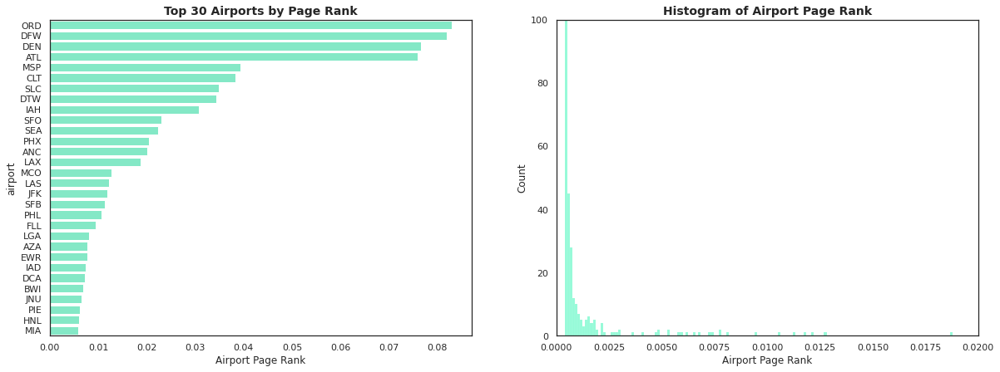

In [0]:
# Plot the page ranks of each airport
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 7))
sns.set(style="white")
page_rank_df_pandas = page_rank_df.toPandas()
page_rank_df_pandas.sort_values(by="page_rank")
sns.barplot(
    data=page_rank_df_pandas.head(30),
    y="airport",
    x="page_rank",
    ax=ax[0],
    color="#73F9CB",
)
sns.histplot(data=page_rank_df_pandas, x="page_rank", color="#73F9CB", ax=ax[1])
ax[0].set_title(
    "Top 30 Airports by Page Rank", fontdict={"fontsize": 14, "fontweight": "bold"}
)
ax[0].set_xlabel("Airport Page Rank")
ax[1].set_title(
    "Histogram of Airport Page Rank", fontdict={"fontsize": 14, "fontweight": "bold"}
)
ax[1].set_xlim([0, 0.02])
ax[1].set_ylim([0, 100])
ax[1].set_xlabel("Airport Page Rank")
plt.show()

**Join the Page Rank Data to Main Data**

Congestion at either the origin or destination airport could impact the probability that a flight is going to be delayed. The page rank data frame will be joined first to the origin then destination airport with the resultant joined column being renamed after each to allow inclusion of both as the 'origin_page_rank' and 'dest_page_rank' feature fields.

In [0]:
page_rank_data = (
    data.join(page_rank_df, page_rank_df["airport"] == data["origin"])
    .withColumnRenamed("page_rank", "origin_page_rank")
    .drop("airport")
)
page_rank_data = page_rank_data.join(
    page_rank_df, page_rank_df["airport"] == page_rank_data["dest"]
).withColumnRenamed("page_rank", "dest_page_rank")
display(page_rank_data)

_utc_dept_ts,_utc_dept_minus2_ts,_utc_dept_actual_ts,_utc_arr_ts,_utc_arr_actual_ts,_dep_time_str,_local_dept_ts,_local_dept_minus2_ts,_local_dept_actual_ts,_local_at_src_airport_arr_ts,_local_at_src_airport_arr_actual_ts,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,origin_airport_iata,origin_airport_tz,origin_airport_type,origin_airport_elevation,origin_airport_iso_country,origin_airport_iso_region,origin_airport_ws_station_id,dest_airport_iata,dest_airport_tz,dest_airport_type,dest_airport_elevation,dest_airport_iso_country,dest_airport_iso_region,dest_airport_ws_station_id,origin_weather_Station,origin_weather_Datehour,origin_weather_Avg_Elevation,origin_weather_Avg_HourlyAltimeterSetting,origin_weather_Avg_HourlyDewPointTemperature,origin_weather_Avg_HourlyDryBulbTemperature,origin_weather_Avg_HourlyPressureChange,origin_weather_Avg_HourlyRelativeHumidity,origin_weather_Avg_HourlySeaLevelPressure,origin_weather_Avg_HourlyStationPressure,origin_weather_Avg_HourlyVisibility,origin_weather_Avg_HourlyWetBulbTemperature,origin_weather_Avg_HourlyWindDirection,origin_weather_Avg_HourlyWindGustSpeed,origin_weather_Avg_HourlyWindSpeed,origin_weather_Avg_Precip_Double,origin_weather_Trace_Rain,origin_weather_NonZero_Rain,origin_weather_HourlyPressureTendency_Increasing,origin_weather_HourlyPressureTendency_Decreasing,origin_weather_HourlyPressureTendency_Constant,origin_weather_Calm_Winds,origin_weather_Sky_Conditions_CLR,origin_weather_Sky_Conditions_FEW,origin_weather_Sky_Conditions_SCT,origin_weather_Sky_Conditions_BKN,origin_weather_Sky_Conditions_OVC,origin_weather_Sky_Conditions_VV,origin_weather_Present_Weather_Drizzle,origin_weather_Present_Weather_Rain,origin_weather_Present_Weather_Snow,origin_weather_Present_Weather_SnowGrains,origin_weather_Present_Weather_IceCrystals,origin_weather_Present_Weather_Hail,origin_weather_Present_Weather_Mist,origin_weather_Present_Weather_Fog,origin_weather_Present_Weather_Smoke,origin_weather_Present_Weather_Dust,origin_weather_Present_Weather_Haze,origin_weather_Present_Weather_Storm,dest_weather_Station,dest_weather_Datehour,dest_weather_Avg_Elevation,dest_weather_Avg_HourlyAltimeterSetting,dest_weather_Avg_HourlyDewPointTemperature,dest_weather_Avg_HourlyDryBulbTemperature,dest_weather_Avg_HourlyPressureChange,dest_weather_Avg_HourlyRelativeHumidity,dest_weather_Avg_HourlySeaLevelPressure,dest_weather_Avg_HourlyStationPressure,dest_weather_Avg_HourlyVisibility,dest_weather_Avg_HourlyWetBulbTemperature,dest_weather_Avg_HourlyWindDirection,dest_weather_Avg_HourlyWindGustSpeed,dest_weather_Avg_HourlyWindSpeed,dest_weather_Avg_Precip_Double,dest_weather_Trace_Rain,dest_weather_NonZero_Rain,dest_weather_HourlyPressureTendency_Increasing,dest_weather_HourlyPressureTendency_Decreasing,dest_weather_HourlyPressureTendency_Constant,dest_weather_Calm_Winds,dest_weather_Sky_Conditions_CLR,dest_weather_Sky_Conditions_FEW,dest_weather_Sky_Conditions_SCT,dest_weather_Sky_Conditions_BKN,dest_weather_Sky_Conditions_OVC,dest_weather_Sky_Conditions_VV,dest_weather_Present_Weather_Drizzle,dest_weather_Present_Weather_Rain,dest_weather_Present_Weather_Snow,dest_weather_Present_Weather_SnowGrains,dest_weather_Present_Wea

In [0]:
# Just for fun - create a pyvis visualization of the airports and maybe a geopandas map plot of them also.

### 2. Holidays 

Often travel surges in the days or weeks before a major US holiday like Christmas or Thanksgiving as individuals travel back to visit their families. Knowing whether a given day is or isn't a holiday is not enough, it would be better to know how many days away a given day is from the next major US holiday. First we will create a dataframe of all holidays, then another dataframe of all days in the 2015-2022 data set. We will then calculate how far away each day is from the next holiday, and join this back to the main flights data set to avoid duplicate computations.

In [0]:
# Create a data frame with all the US holidays
us_holidays = holidays.US()
holiday_datetimes = list(
    holidays.US(years=[2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022]).keys()
)
holiday_strings = list(map(lambda x: x.strftime("%m/%d/%Y"), holiday_datetimes))
us_holidays_df = pd.DataFrame(
    list(zip(holiday_datetimes, holiday_strings)), columns=["datetime", "date_string"]
)
# us_holidays_df = spark.createDataFrame(us_holidays_df)
display(us_holidays_df)

datetime,date_string
2016-01-01,01/01/2016
2016-01-18,01/18/2016
2016-02-15,02/15/2016
2016-05-30,05/30/2016
2016-07-04,07/04/2016
2016-09-05,09/05/2016
2016-10-10,10/10/2016
2016-11-11,11/11/2016
2016-11-24,11/24/2016
2016-12-25,12/25/2016


In [0]:
# Create a data frame of all the unique dates in the flight data set
import datetime

unique_dates = pd.DataFrame(
    page_rank_data.select("fl_date").distinct().collect(), columns=["flight_date"]
)
unique_dates["flight_date_time"] = list(
    map(
        lambda x: datetime.datetime.strptime(x, "%Y-%m-%d").date(),
        unique_dates["flight_date"],
    )
)
display(unique_dates)

flight_date,flight_date_time
2017-12-05,2017-12-05
2017-05-14,2017-05-14
2017-05-11,2017-05-11
2017-12-22,2017-12-22
2017-10-20,2017-10-20
2017-02-24,2017-02-24
2017-08-18,2017-08-18
2017-09-12,2017-09-12
2017-04-30,2017-04-30
2017-03-08,2017-03-08


In [0]:
# Calculate the days away from the next holiday for every unique day in the flight data
from functools import partial


def days_to_next_holiday(holiday_list, date):
    """"""
    days_to_holiday = list(map(lambda holiday: (date - holiday).days, holiday_list))
    future_holidays = [stretch for stretch in days_to_holiday if stretch < 0]
    min_stretch = np.abs(np.max(future_holidays))
    return min_stretch


holidays_list = us_holidays_df.datetime.to_list()
unique_dates["days_to_next_holiday"] = list(
    map(partial(days_to_next_holiday, holidays_list), unique_dates["flight_date_time"])
)
unique_dates.head(10)

,flight_date,flight_date_time,days_to_next_holiday
0,2017-12-05,2017-12-05,20
1,2017-05-14,2017-05-14,15
2,2017-05-11,2017-05-11,18
3,2017-12-22,2017-12-22,3
4,2017-10-20,2017-10-20,21
5,2017-02-24,2017-02-24,94
6,2017-08-18,2017-08-18,17
7,2017-09-12,2017-09-12,27
8,2017-04-30,2017-04-30,29
9,2017-03-08,2017-03-08,82


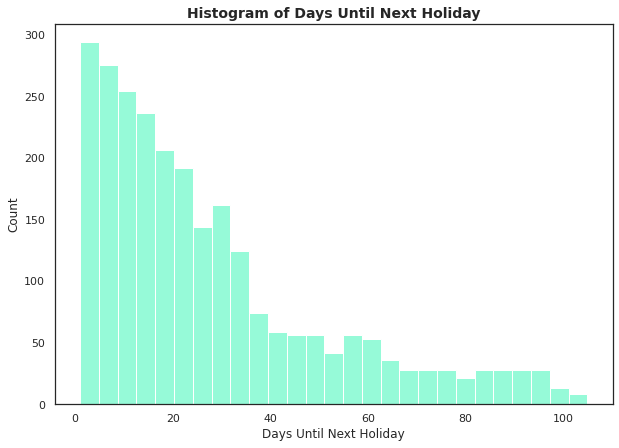

In [0]:
# Plot the page ranks of each airport
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 7))
sns.set(style="white")
sns.histplot(data=unique_dates, x="days_to_next_holiday", color="#73F9CB", ax=ax)
ax.set_title(
    "Histogram of Days Until Next Holiday",
    fontdict={"fontsize": 14, "fontweight": "bold"},
)
ax.set_xlabel("Days Until Next Holiday")
plt.show()

In [0]:
# Join the unique_days data frame to the previously created page_rank_data dataframe to include all features.
schema = StructType(
    [
        StructField("flight_date", StringType(), True),
        StructField("days_to_next_holiday", IntegerType(), True),
    ]
)
days_to_next_holiday = spark.createDataFrame(
    unique_dates[["flight_date", "days_to_next_holiday"]], schema=schema
)
holiday_data = page_rank_data.join(
    days_to_next_holiday,
    days_to_next_holiday["flight_date"] == page_rank_data["FL_DATE"],
).drop("airport", "flight_date")
display(holiday_data)

_utc_dept_ts,_utc_dept_minus2_ts,_utc_dept_actual_ts,_utc_arr_ts,_utc_arr_actual_ts,_dep_time_str,_local_dept_ts,_local_dept_minus2_ts,_local_dept_actual_ts,_local_at_src_airport_arr_ts,_local_at_src_airport_arr_actual_ts,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,origin_airport_iata,origin_airport_tz,origin_airport_type,origin_airport_elevation,origin_airport_iso_country,origin_airport_iso_region,origin_airport_ws_station_id,dest_airport_iata,dest_airport_tz,dest_airport_type,dest_airport_elevation,dest_airport_iso_country,dest_airport_iso_region,dest_airport_ws_station_id,origin_weather_Station,origin_weather_Datehour,origin_weather_Avg_Elevation,origin_weather_Avg_HourlyAltimeterSetting,origin_weather_Avg_HourlyDewPointTemperature,origin_weather_Avg_HourlyDryBulbTemperature,origin_weather_Avg_HourlyPressureChange,origin_weather_Avg_HourlyRelativeHumidity,origin_weather_Avg_HourlySeaLevelPressure,origin_weather_Avg_HourlyStationPressure,origin_weather_Avg_HourlyVisibility,origin_weather_Avg_HourlyWetBulbTemperature,origin_weather_Avg_HourlyWindDirection,origin_weather_Avg_HourlyWindGustSpeed,origin_weather_Avg_HourlyWindSpeed,origin_weather_Avg_Precip_Double,origin_weather_Trace_Rain,origin_weather_NonZero_Rain,origin_weather_HourlyPressureTendency_Increasing,origin_weather_HourlyPressureTendency_Decreasing,origin_weather_HourlyPressureTendency_Constant,origin_weather_Calm_Winds,origin_weather_Sky_Conditions_CLR,origin_weather_Sky_Conditions_FEW,origin_weather_Sky_Conditions_SCT,origin_weather_Sky_Conditions_BKN,origin_weather_Sky_Conditions_OVC,origin_weather_Sky_Conditions_VV,origin_weather_Present_Weather_Drizzle,origin_weather_Present_Weather_Rain,origin_weather_Present_Weather_Snow,origin_weather_Present_Weather_SnowGrains,origin_weather_Present_Weather_IceCrystals,origin_weather_Present_Weather_Hail,origin_weather_Present_Weather_Mist,origin_weather_Present_Weather_Fog,origin_weather_Present_Weather_Smoke,origin_weather_Present_Weather_Dust,origin_weather_Present_Weather_Haze,origin_weather_Present_Weather_Storm,dest_weather_Station,dest_weather_Datehour,dest_weather_Avg_Elevation,dest_weather_Avg_HourlyAltimeterSetting,dest_weather_Avg_HourlyDewPointTemperature,dest_weather_Avg_HourlyDryBulbTemperature,dest_weather_Avg_HourlyPressureChange,dest_weather_Avg_HourlyRelativeHumidity,dest_weather_Avg_HourlySeaLevelPressure,dest_weather_Avg_HourlyStationPressure,dest_weather_Avg_HourlyVisibility,dest_weather_Avg_HourlyWetBulbTemperature,dest_weather_Avg_HourlyWindDirection,dest_weather_Avg_HourlyWindGustSpeed,dest_weather_Avg_HourlyWindSpeed,dest_weather_Avg_Precip_Double,dest_weather_Trace_Rain,dest_weather_NonZero_Rain,dest_weather_HourlyPressureTendency_Increasing,dest_weather_HourlyPressureTendency_Decreasing,dest_weather_HourlyPressureTendency_Constant,dest_weather_Calm_Winds,dest_weather_Sky_Conditions_CLR,dest_weather_Sky_Conditions_FEW,dest_weather_Sky_Conditions_SCT,dest_weather_Sky_Conditions_BKN,dest_weather_Sky_Conditions_OVC,dest_weather_Sky_Conditions_VV,dest_weather_Present_Weather_Drizzle,dest_weather_Present_Weather_Rain,dest_weather_Present_Weather_Snow,dest_weather_Present_Weather_SnowGrains,dest_weather_Present_Wea

### 3. Volume Sigma 

According to the FAA the volume of flights at a given airport is a key factor impacting the likelihood of flight delays due to gate and taxi-way traffic overload. Since the scheduled flights for the next day could be known before the two hour pre-arrival interval despite the data including flights after the departure time of a given flight on that day, it is still a valid feature to include in the 2-hour pre-depature predictive model. To operationalize the volume metric for each airport the following computations are performed below: 
* Count the number of scheduled departures for each airport 'origin' on each depature date in the flights data set
* Calculate the overall average number of flights and the standard deviation for each airport in the 'airport_volume_stats' view 
* Join the day acounts and flight statistics to the main flights data dataframe. 
* Create a new column in the flights data called 'volume_sigma' reflecting how many standard deviations the count for that day is away from the mean for the airport. 

The idea with this metric is that total count for the day and airport is not an adequate metric on its own given the significant variation in the expected departures for a given airport (Atlanta GA vs. Sioux Falls SD for example). The 'volume_sigma' metric is normalized regardless of the airport and will be positive and greater than 1 or so on very busy days and negative and less than 1 on slow days.

In [0]:
holiday_data_view = holiday_data.createOrReplaceTempView("holiday_data_view")

# Count the number of unique scheduled departure times from each origin airport on a daily basis to understand the flight 'volume' distribution
air_traffic_by_day = spark.sql(
    """SELECT origin as origin_traffic, fl_date as traffic_date, count(tail_num, crs_dep_time) AS traffic 
                                  FROM holiday_data_view GROUP BY origin_traffic, traffic_date ORDER BY traffic_date, traffic DESC"""
)

# Register air_traffic by data as a new view to use SQL and then computer the overall average and standard deviation in the count by each airport to get a 'range' of volume variation
air_traffic_by_day.createOrReplaceTempView("air_traffic_by_day")
airport_volume_stats = spark.sql(
    """SELECT origin_traffic as volume_origin, avg(traffic) as average_daily_departures, std(traffic) as sigma_daily_departures
                                    FROM air_traffic_by_day GROUP BY origin_traffic ORDER BY average_daily_departures DESC"""
)

# First join the overall stats to the corresponding airport then calculate the number of sigmas away from the average each days count is
air_traffic_by_day = (
    air_traffic_by_day.join(
        airport_volume_stats,
        airport_volume_stats["volume_origin"] == air_traffic_by_day["origin_traffic"],
        "left",
    )
    .withColumn(
        "volume_sigma",
        (col("traffic") - col("average_daily_departures"))
        / col("sigma_daily_departures"),
    )
    .withColumn(
        "volume_sigma",
        when(col("volume_sigma").isNull(), 0).otherwise(col("volume_sigma")),
    )
    .select("origin_traffic", "traffic_date", "traffic", "volume_sigma")
)

# Then join the air traffic_by_day feature dataframe to the main data frame
volume_sigma_data = holiday_data.join(
    air_traffic_by_day,
    (air_traffic_by_day["traffic_date"] == holiday_data["fl_date"])
    & (air_traffic_by_day["origin_traffic"] == holiday_data["origin"]),
    "left",
).cache()
volume_sigma_data.createOrReplaceTempView("flight_traffic")
display(volume_sigma_data)

_utc_dept_ts,_utc_dept_minus2_ts,_utc_dept_actual_ts,_utc_arr_ts,_utc_arr_actual_ts,_dep_time_str,_local_dept_ts,_local_dept_minus2_ts,_local_dept_actual_ts,_local_at_src_airport_arr_ts,_local_at_src_airport_arr_actual_ts,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,origin_airport_iata,origin_airport_tz,origin_airport_type,origin_airport_elevation,origin_airport_iso_country,origin_airport_iso_region,origin_airport_ws_station_id,dest_airport_iata,dest_airport_tz,dest_airport_type,dest_airport_elevation,dest_airport_iso_country,dest_airport_iso_region,dest_airport_ws_station_id,origin_weather_Station,origin_weather_Datehour,origin_weather_Avg_Elevation,origin_weather_Avg_HourlyAltimeterSetting,origin_weather_Avg_HourlyDewPointTemperature,origin_weather_Avg_HourlyDryBulbTemperature,origin_weather_Avg_HourlyPressureChange,origin_weather_Avg_HourlyRelativeHumidity,origin_weather_Avg_HourlySeaLevelPressure,origin_weather_Avg_HourlyStationPressure,origin_weather_Avg_HourlyVisibility,origin_weather_Avg_HourlyWetBulbTemperature,origin_weather_Avg_HourlyWindDirection,origin_weather_Avg_HourlyWindGustSpeed,origin_weather_Avg_HourlyWindSpeed,origin_weather_Avg_Precip_Double,origin_weather_Trace_Rain,origin_weather_NonZero_Rain,origin_weather_HourlyPressureTendency_Increasing,origin_weather_HourlyPressureTendency_Decreasing,origin_weather_HourlyPressureTendency_Constant,origin_weather_Calm_Winds,origin_weather_Sky_Conditions_CLR,origin_weather_Sky_Conditions_FEW,origin_weather_Sky_Conditions_SCT,origin_weather_Sky_Conditions_BKN,origin_weather_Sky_Conditions_OVC,origin_weather_Sky_Conditions_VV,origin_weather_Present_Weather_Drizzle,origin_weather_Present_Weather_Rain,origin_weather_Present_Weather_Snow,origin_weather_Present_Weather_SnowGrains,origin_weather_Present_Weather_IceCrystals,origin_weather_Present_Weather_Hail,origin_weather_Present_Weather_Mist,origin_weather_Present_Weather_Fog,origin_weather_Present_Weather_Smoke,origin_weather_Present_Weather_Dust,origin_weather_Present_Weather_Haze,origin_weather_Present_Weather_Storm,dest_weather_Station,dest_weather_Datehour,dest_weather_Avg_Elevation,dest_weather_Avg_HourlyAltimeterSetting,dest_weather_Avg_HourlyDewPointTemperature,dest_weather_Avg_HourlyDryBulbTemperature,dest_weather_Avg_HourlyPressureChange,dest_weather_Avg_HourlyRelativeHumidity,dest_weather_Avg_HourlySeaLevelPressure,dest_weather_Avg_HourlyStationPressure,dest_weather_Avg_HourlyVisibility,dest_weather_Avg_HourlyWetBulbTemperature,dest_weather_Avg_HourlyWindDirection,dest_weather_Avg_HourlyWindGustSpeed,dest_weather_Avg_HourlyWindSpeed,dest_weather_Avg_Precip_Double,dest_weather_Trace_Rain,dest_weather_NonZero_Rain,dest_weather_HourlyPressureTendency_Increasing,dest_weather_HourlyPressureTendency_Decreasing,dest_weather_HourlyPressureTendency_Constant,dest_weather_Calm_Winds,dest_weather_Sky_Conditions_CLR,dest_weather_Sky_Conditions_FEW,dest_weather_Sky_Conditions_SCT,dest_weather_Sky_Conditions_BKN,dest_weather_Sky_Conditions_OVC,dest_weather_Sky_Conditions_VV,dest_weather_Present_Weather_Drizzle,dest_weather_Present_Weather_Rain,dest_weather_Present_Weather_Snow,dest_weather_Present_Weather_SnowGrains,dest_weather_Present_Wea

In [0]:
display(volume_sigma_data.select("volume_sigma"))

volume_sigma
-0.911900766357408
-0.911900766357408
-0.911900766357408
-0.911900766357408
-0.911900766357408
-0.911900766357408
-0.911900766357408
-0.911900766357408
-0.911900766357408
-0.911900766357408


Output can only be rendered in Databricks

### 4. Inbound Departure Delay

Airplanes typically fly for extended periods [reference](www.apple.com) without extended maintenance other than re-fueling and de-icing which can occur quickly between two flights. In other words, a given tail-number could remain in 'circulation' for a period spanning several days. If we partition the flight data by a given tail number and sort by the scheduled departure time, then we can take the the 'lagging' row from and access the departure delaye time.

In [0]:
# Figure out how delayed the departure of the the previous flight on the plane that is about to depart was if there was one on the same day.
departure_delay_data = spark.sql(
    """SELECT *, lag(dep_delay, -1) OVER (
        PARTITION BY tail_num
        ORDER BY _utc_dept_minus2_ts  
     ) AS inbound_dep_delay_time FROM flight_traffic"""
).withColumn(
    "inbound_dep_delay_time",
    when(col("inbound_dep_delay_time").isNull(), 0).otherwise(
        col("inbound_dep_delay_time")
    ),
)
display(departure_delay_data)

_utc_dept_ts,_utc_dept_minus2_ts,_utc_dept_actual_ts,_utc_arr_ts,_utc_arr_actual_ts,_dep_time_str,_local_dept_ts,_local_dept_minus2_ts,_local_dept_actual_ts,_local_at_src_airport_arr_ts,_local_at_src_airport_arr_actual_ts,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,origin_airport_iata,origin_airport_tz,origin_airport_type,origin_airport_elevation,origin_airport_iso_country,origin_airport_iso_region,origin_airport_ws_station_id,dest_airport_iata,dest_airport_tz,dest_airport_type,dest_airport_elevation,dest_airport_iso_country,dest_airport_iso_region,dest_airport_ws_station_id,origin_weather_Station,origin_weather_Datehour,origin_weather_Avg_Elevation,origin_weather_Avg_HourlyAltimeterSetting,origin_weather_Avg_HourlyDewPointTemperature,origin_weather_Avg_HourlyDryBulbTemperature,origin_weather_Avg_HourlyPressureChange,origin_weather_Avg_HourlyRelativeHumidity,origin_weather_Avg_HourlySeaLevelPressure,origin_weather_Avg_HourlyStationPressure,origin_weather_Avg_HourlyVisibility,origin_weather_Avg_HourlyWetBulbTemperature,origin_weather_Avg_HourlyWindDirection,origin_weather_Avg_HourlyWindGustSpeed,origin_weather_Avg_HourlyWindSpeed,origin_weather_Avg_Precip_Double,origin_weather_Trace_Rain,origin_weather_NonZero_Rain,origin_weather_HourlyPressureTendency_Increasing,origin_weather_HourlyPressureTendency_Decreasing,origin_weather_HourlyPressureTendency_Constant,origin_weather_Calm_Winds,origin_weather_Sky_Conditions_CLR,origin_weather_Sky_Conditions_FEW,origin_weather_Sky_Conditions_SCT,origin_weather_Sky_Conditions_BKN,origin_weather_Sky_Conditions_OVC,origin_weather_Sky_Conditions_VV,origin_weather_Present_Weather_Drizzle,origin_weather_Present_Weather_Rain,origin_weather_Present_Weather_Snow,origin_weather_Present_Weather_SnowGrains,origin_weather_Present_Weather_IceCrystals,origin_weather_Present_Weather_Hail,origin_weather_Present_Weather_Mist,origin_weather_Present_Weather_Fog,origin_weather_Present_Weather_Smoke,origin_weather_Present_Weather_Dust,origin_weather_Present_Weather_Haze,origin_weather_Present_Weather_Storm,dest_weather_Station,dest_weather_Datehour,dest_weather_Avg_Elevation,dest_weather_Avg_HourlyAltimeterSetting,dest_weather_Avg_HourlyDewPointTemperature,dest_weather_Avg_HourlyDryBulbTemperature,dest_weather_Avg_HourlyPressureChange,dest_weather_Avg_HourlyRelativeHumidity,dest_weather_Avg_HourlySeaLevelPressure,dest_weather_Avg_HourlyStationPressure,dest_weather_Avg_HourlyVisibility,dest_weather_Avg_HourlyWetBulbTemperature,dest_weather_Avg_HourlyWindDirection,dest_weather_Avg_HourlyWindGustSpeed,dest_weather_Avg_HourlyWindSpeed,dest_weather_Avg_Precip_Double,dest_weather_Trace_Rain,dest_weather_NonZero_Rain,dest_weather_HourlyPressureTendency_Increasing,dest_weather_HourlyPressureTendency_Decreasing,dest_weather_HourlyPressureTendency_Constant,dest_weather_Calm_Winds,dest_weather_Sky_Conditions_CLR,dest_weather_Sky_Conditions_FEW,dest_weather_Sky_Conditions_SCT,dest_weather_Sky_Conditions_BKN,dest_weather_Sky_Conditions_OVC,dest_weather_Sky_Conditions_VV,dest_weather_Present_Weather_Drizzle,dest_weather_Present_Weather_Rain,dest_weather_Present_Weather_Snow,dest_weather_Present_Weather_SnowGrains,dest_weather_Present_Wea

### 5. Delay Fraction in Last 4 Hours 

While we may not know for sure if an upcoming flight is delayed, it is reasonable to assume that if there are other flights being delayed or cancelled at the airport shortly before the 2 hour pre-departure time of the flight of interest than it is more likely that other flights are going to be delayed. Below the flights data is partitioned by the origin airport name, then sorted by scheduled 2-hour pre-departure time '2HR_PRE_DEP'. The number of delays in a window 4 hours before each '2HR_PRE_DEP' time is stored as 'delays_last_4_hrs'.

In [0]:
# Window the flights data frame around a sorted partition of flights data in 4 hour increments to count how many flights were delayed at the airport so far in a specified interval before the
departure_delay_data.createOrReplaceTempView("flight_traffic")
final_data = spark.sql(
    """SELECT *, 
        sum(dep_del15 + cancelled) OVER (PARTITION BY origin ORDER BY _utc_dept_minus2_ts RANGE BETWEEN INTERVAL 4 HOURS PRECEDING AND CURRENT ROW) / 
        COUNT(dep_del15) OVER (PARTITION BY origin ORDER BY _utc_dept_minus2_ts RANGE BETWEEN INTERVAL 4 HOURS PRECEDING AND CURRENT ROW) as fraction_delayed_last_4hrs
       FROM flight_traffic"""
).withColumn(
    "delays_last_4hrs",
    when(col("fraction_delayed_last_4hrs").isNull(), 0).otherwise(
        col("fraction_delayed_last_4hrs")
    ),
)
display(
    final_data.select("origin", "_utc_dept_minus2_ts", "fraction_delayed_last_4hrs")
)
final_data.createOrReplaceTempView("final_data")

origin,_utc_dept_minus2_ts,fraction_delayed_last_4hrs
ATW,2015-01-01T10:00:00.000+0000,0.0
ATW,2015-01-01T10:00:00.000+0000,0.0
ATW,2015-01-01T15:11:00.000+0000,0.0
ATW,2015-01-01T17:23:00.000+0000,0.0
ATW,2015-01-01T22:17:00.000+0000,0.0
ATW,2015-01-02T10:00:00.000+0000,0.0
ATW,2015-01-02T10:00:00.000+0000,0.0
ATW,2015-01-02T17:23:00.000+0000,0.0
ATW,2015-01-02T20:57:00.000+0000,0.0
ATW,2015-01-02T22:17:00.000+0000,0.0


Output can only be rendered in Databricks

## Save to the blob

In [0]:
blob_container = (
    "section7group2"  # The name of your container created in https://portal.azure.com
)
storage_account = "section7group2"  # The name of your Storage account created in https://portal.azure.com
secret_scope = "s7g2_scope"  # The name of the scope created in your local computer using the Databricks CLI
secret_key = "s7g2_scope_key"  # saskey The name of the secret key created in your local computer using the Databricks CLI
blob_url = f"wasbs://{blob_container}@{storage_account}.blob.core.windows.net"
mount_path = "/mnt/mids-w261"

spark.conf.set(
    f"fs.azure.sas.{blob_container}.{storage_account}.blob.core.windows.net",
    dbutils.secrets.get(scope=secret_scope, key=secret_key),
)

final_data.write.parquet(f"{blob_url}/final_data_phase4_3_Dec")

### Load From the Blob (For Reference to Team)

In [0]:
blob_container = (
    "section7group2"  # The name of your container created in https://portal.azure.com
)
storage_account = "section7group2"  # The name of your Storage account created in https://portal.azure.com
secret_scope = "s7g2_scope"  # The name of the scope created in your local computer using the Databricks CLI
secret_key = "s7g2_scope_key"  # saskey The name of the secret key created in your local computer using the Databricks CLI
blob_url = f"wasbs://{blob_container}@{storage_account}.blob.core.windows.net"
mount_path = "/mnt/mids-w261"

spark.conf.set(
    f"fs.azure.sas.{blob_container}.{storage_account}.blob.core.windows.net",
    dbutils.secrets.get(scope=secret_scope, key=secret_key),
)

page_rank_df = spark.read.parquet(f"{blob_url}/airport_page_rank")
final_data = spark.read.parquet(f"{blob_url}/final_data_phase4_3_Dec")
print(f"Data size: {final_data.count()} rows and {len(final_data.columns)}")

Data size: 42271607 rows and 179
